In [1]:
import MontagePy
import montage_wrapper


    ERROR: Montage commands could not be found.

    In order to use the montage_wrapper module, you will first need to
    install the IPAC Montage software from:

        http://montage.ipac.caltech.edu

    and ensure that the Montage commands (e.g. mAdd, mProject, etc.) are in
    your $PATH. Your current $PATH variable contains the following paths,
    but none of them contain the Montage commands:

        PATH = /Users/brettlv/anaconda2/bin:/Users/brettlv/src_heasoft/heaso
           ft-6.25/x86_64-apple-darwin16.7.0/bin:/Users/brettlv/anaconda
           2/bin:/Users/brettlv/anaconda3/envs/ipykernel_py2/bin:/Users/
           brettlv/anaconda2/bin:/Users/brettlv/anaconda3/bin:/opt/local
           /bin:/opt/local/sbin:.:/Users/brettlv/AIPS/31DEC17/MACINT/SYS
           TEM/BRETT:/Users/brettlv/AIPS/31DEC17/SYSTEM/UNIX:/usr/local/
           opt/libxml2/bin:/Users/brettlv/anaconda3/bin:/Users/brettlv/D
           ownloads/tutorial_of_astro/difmap:/Users/brettlv/anaconda3/bi
   

SystemExit: 1

To exit: use 'exit', 'quit', or Ctrl-D.


pip install MontagePy

[MontagePy](http://montage.ipac.caltech.edu/MontageNotebooks/Mosaic.html)


[reproject](https://reproject.readthedocs.io/en/stable/)

In [2]:
# Startup.  The Montage modules are pretty much self-contained
# but this script needs a few extra utilities.

import os
import sys
import shutil

from MontagePy.main    import *
from MontagePy.archive import *

from IPython.display import Image


# These are the parameters defining the mosaic we want to make.

location  = "M 17"
size      = 1.0
dataset   = "2MASS J"
workdir   = "Messier017"

So not much to see so far. We've defined a location on the sky (which can be either an object name (e.g. "Messier 017") or coordinates. The coordinate parser is pretty flexible; "3h 29m 53s +47d 11m 43s" (defaults to the Equatorial J2000 system), "201.94301 47.45294 Equ B1950" and "104.85154 68.56078 Galactic" all work. We've also defined a size. In this case we are going to use this below to construct a simple North-up gnomonic projection square box on the sky; you are free to define any header you like as Montage supports all standard astronomical projections and coordinate systems.

In [2]:
pwd

'/Users/brettlv/blog/brettlv.github.io/pythoncode'

In [3]:
# We create and move into subdirectories in this notebook 
# but we want to come back to the original startup directory 
# whenever we restart the processing. 

try:
    home
except:
    home = os.getcwd()

os.chdir(home)

print("Startup folder: " + home)


# Clean out any old copy of the work tree, then remake it
# and the set of the subdirectories we will need.

try:
    shutil.rmtree(workdir)
except:
    print("                Can't delete work tree; probably doesn't exist yet", flush=True)

print("Work directory: " + workdir, flush=True)

os.makedirs(workdir)  

os.chdir(workdir)

os.makedirs("raw")
os.makedirs("projected")
os.makedirs("diffs")
os.makedirs("corrected")

Startup folder: /Users/brettlv/blog/brettlv.github.io/pythoncode
                Can't delete work tree; probably doesn't exist yet
Work directory: Messier017


In [5]:
pwd

'/Users/brettlv/blog/brettlv.github.io/pythoncode/Messier017'

In [6]:
ls

corrected/ diffs/     projected/ raw/


In [7]:
# Create the FITS header for the mosaic.

rtn = mHdr(location, size, size, "region.hdr")

print("mHdr:             " + str(rtn), flush=True)


# Retrieve archive images covering the region then scan 
# the images for their coverage metadata.

rtn = mArchiveDownload(dataset, location, size, "raw")

print("mArchiveDownload: " + str(rtn), flush=True)

rtn = mImgtbl("raw", "rimages.tbl")

print("mImgtbl (raw):    " + str(rtn), flush=True)

mHdr:             {'status': '0', 'count': 16}
mArchiveDownload: {'status': '0', 'count': 49}
mImgtbl (raw):    {'status': '0', 'count': 49, 'badfits': 0, 'badwcs': 0}


In [8]:
# Reproject the original images to the  frame of the 
# output FITS header we created

rtn = mProjExec("raw", "rimages.tbl", "region.hdr", projdir="projected", quickMode=True)

print("mProjExec:           " + str(rtn), flush=True)

mImgtbl("projected", "pimages.tbl")

print("mImgtbl (projected): " + str(rtn), flush=True)

mProjExec:           {'status': '0', 'count': 49, 'failed': 0, 'nooverlap': 0}
mImgtbl (projected): {'status': '0', 'count': 49, 'failed': 0, 'nooverlap': 0}


In [9]:
# Coadd the projected images without backgound correction.
# This step is just to illustrate the need for background correction
# and can be omitted.

rtn = mAdd("projected", "pimages.tbl", "region.hdr", "uncorrected.fits")

print("mAdd:    " + str(rtn), flush=True)

mAdd:    {'status': '0', 'time': 2.0}


mViewer: {'status': '0', 'type': b'grayscale', 'nx': 3601, 'ny': 3600, 'grayminval': 140.13198648721342, 'grayminpercent': 0.0, 'grayminsigma': -2.0, 'graymaxval': 10630.5380859375, 'graymaxpercent': 100.0, 'graymaxsigma': 1705.7790696867876, 'blueminval': 0.0, 'blueminpercent': 0.0, 'blueminsigma': 0.0, 'bluemaxval': 0.0, 'bluemaxpercent': 0.0, 'bluemaxsigma': 0.0, 'greenminval': 0.0, 'greenminpercent': 0.0, 'greenminsigma': 0.0, 'greenmaxval': 0.0, 'greenmaxpercent': 0.0, 'greenmaxsigma': 0.0, 'redminval': 0.0, 'redminpercent': 0.0, 'redminsigma': 0.0, 'redmaxval': 0.0, 'redmaxpercent': 0.0, 'redmaxsigma': 0.0, 'graydatamin': 142.23333740234375, 'graydatamax': 10630.5380859375, 'bdatamin': 0.0, 'bdatamax': 0.0, 'gdatamin': 0.0, 'gdatamax': 0.0, 'rdatamin': 0.0, 'rdatamax': 0.0, 'flipX': 0, 'flipY': 1, 'colortable': 1, 'bunit': b''}


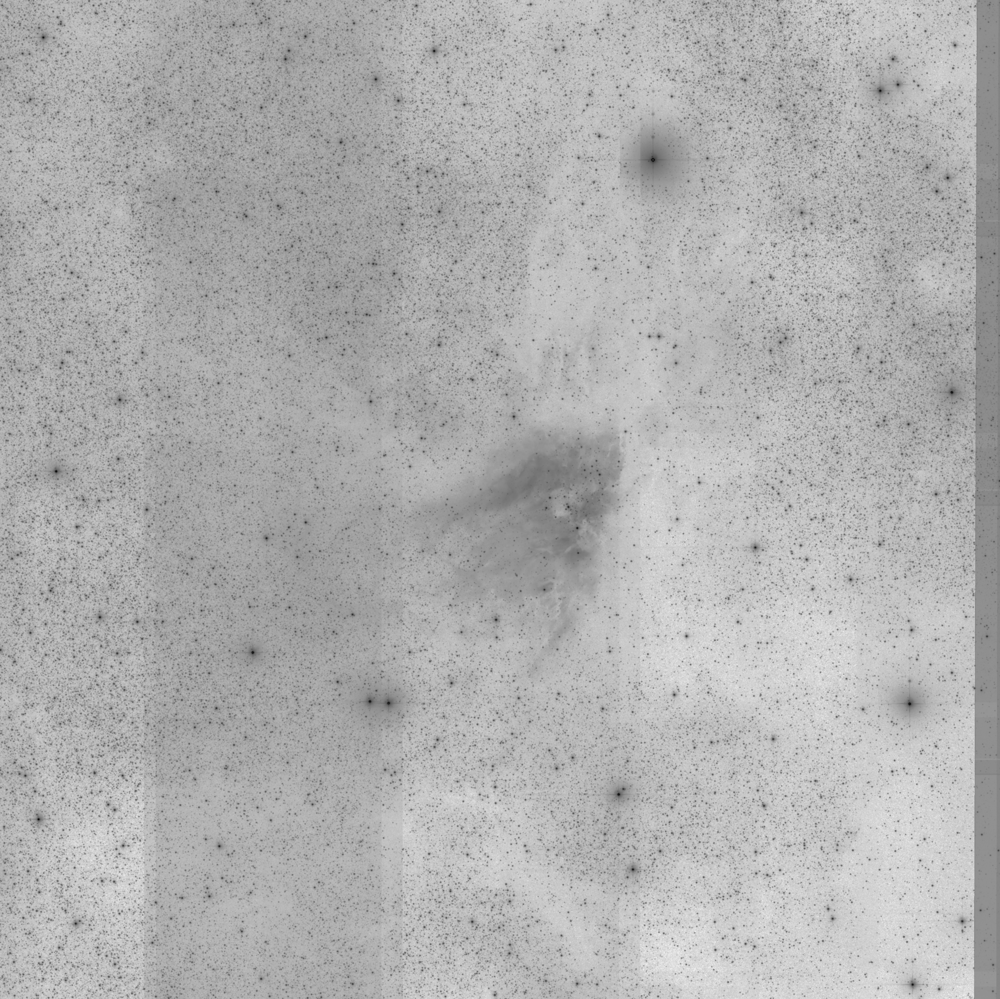

In [10]:
# Make a PNG rendering of the data and display it.

rtn = mViewer("-ct 1 -gray uncorrected.fits -2s max gaussian-log -out uncorrected.png", "", mode=2)

print("mViewer: " + str(rtn), flush=True)

Image(filename='uncorrected.png')

In [11]:
# Determine the overlaps between images (for background modeling).

rtn = mOverlaps("pimages.tbl", "diffs.tbl")

print("mOverlaps:    " + str(rtn), flush=True)


# Generate difference images and fit them.

rtn = mDiffFitExec("projected", "diffs.tbl", "region.hdr", "diffs", "fits.tbl")

print("mDiffFitExec: " + str(rtn), flush=True)


# Model the background corrections.

rtn = mBgModel("pimages.tbl", "fits.tbl", "corrections.tbl")

print("mBgModel:     " + str(rtn), flush=True)

mOverlaps:    {'status': '0', 'count': 128}
mDiffFitExec: {'status': '0', 'count': 128, 'diff_failed': 0, 'fit_failed': 0, 'warning': 0}
mBgModel:     {'status': '0'}


In [12]:
# Background correct the projected images.

rtn = mBgExec("projected", "pimages.tbl", "corrections.tbl", "corrected")

print("mBgExec:             " + str(rtn), flush=True)

rtn = mImgtbl("corrected", "cimages.tbl")

print("mImgtbl (corrected): " + str(rtn), flush=True)


# Coadd the background-corrected, projected images.

rtn = mAdd("corrected", "cimages.tbl", "region.hdr", "mosaic.fits")

print("mAdd:                " + str(rtn), flush=True)

mBgExec:             {'status': '0', 'count': 49, 'nocorrection': 0, 'failed': 0}
mImgtbl (corrected): {'status': '0', 'count': 49, 'badfits': 0, 'badwcs': 0}
mAdd:                {'status': '0', 'time': 2.0}


In [13]:
# Make a PNG rendering of the data and display it.

rtn = mViewer("-ct 1 -gray mosaic.fits -2s max gaussian-log -out mosaic.png", "", mode=2)

print("mViewer: " + str(rtn), flush=True)

mViewer: {'status': '0', 'type': b'grayscale', 'nx': 3601, 'ny': 3600, 'grayminval': 149.65555135027859, 'grayminpercent': 0.0, 'grayminsigma': -2.0, 'graymaxval': 10638.9737283475, 'graymaxpercent': 100.0, 'graymaxsigma': 2248.6495470076525, 'blueminval': 0.0, 'blueminpercent': 0.0, 'blueminsigma': 0.0, 'bluemaxval': 0.0, 'bluemaxpercent': 0.0, 'bluemaxsigma': 0.0, 'greenminval': 0.0, 'greenminpercent': 0.0, 'greenminsigma': 0.0, 'greenmaxval': 0.0, 'greenmaxpercent': 0.0, 'greenmaxsigma': 0.0, 'redminval': 0.0, 'redminpercent': 0.0, 'redminsigma': 0.0, 'redmaxval': 0.0, 'redmaxpercent': 0.0, 'redmaxsigma': 0.0, 'graydatamin': 150.77275125210937, 'graydatamax': 10638.9737283475, 'bdatamin': 0.0, 'bdatamax': 0.0, 'gdatamin': 0.0, 'gdatamax': 0.0, 'rdatamin': 0.0, 'rdatamax': 0.0, 'flipX': 0, 'flipY': 1, 'colortable': 1, 'bunit': b''}


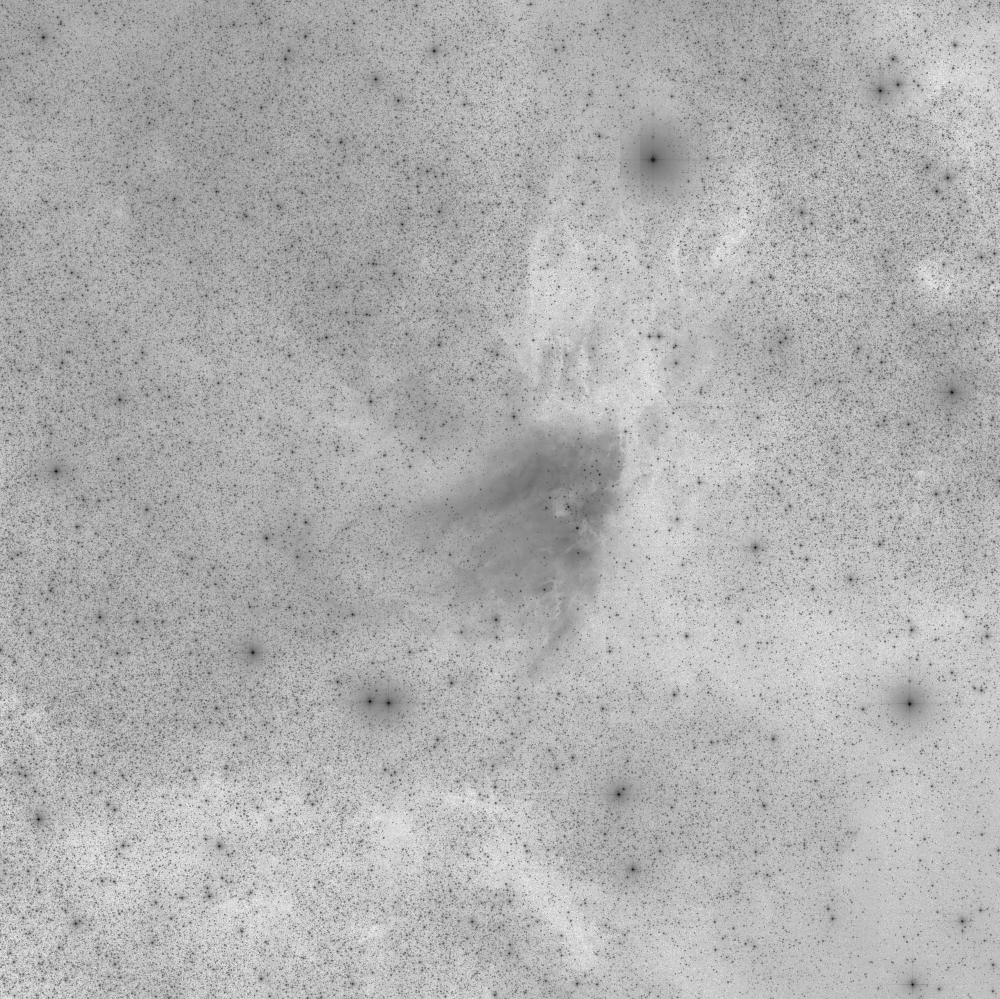

In [14]:
Image(filename='mosaic.png')

In [15]:
pwd

'/Users/brettlv/blog/brettlv.github.io/pythoncode/Messier017'